In [1]:
# 📦 1. Imports
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
import datetime
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import re

2025-04-04 13:49:29.477298: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743767369.564803   28420 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743767369.588522   28420 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1743767369.796491   28420 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1743767369.796552   28420 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1743767369.796554   28420 computation_placer.cc:177] computation placer alr

In [2]:
# 💾 2. Paramètres
IMG_HEIGHT = 150
IMG_WIDTH = 150
BATCH_SIZE = 32
EPOCHS = 20
DATASET_PATH = "/mnt/c/Users/quent/Documents/Devoir/CESI/Deep learning/OneDrive_2025-03-26/Data Science/Datasets/Dataset Livrable 1 - Clean"  
LOG_DIR = 'Data Science/Projet/logs'

In [3]:
import os
import random
import shutil

# Chemins des dossiers
input_dir = "/mnt/c/Users/quent/Documents/Devoir/CESI/Deep learning/OneDrive_2025-03-26/Data Science/Datasets/imagenet-sketch/sketch"  # Remplace par le chemin réel du dataset
output_dir = "/mnt/c/Users/quent/Documents/Devoir/CESI/Deep learning/OneDrive_2025-03-26/Data Science/Datasets/Dataset Livrable 1 - Clean/Sketch"  # Dossier où stocker les images sélectionnées

# S'assurer que le dossier de sortie existe
os.makedirs(output_dir, exist_ok=True)

# Liste des sous-dossiers
subfolders = [os.path.join(input_dir, d) for d in os.listdir(input_dir) if os.path.isdir(os.path.join(input_dir, d))]

# Liste des images sélectionnées
selected_images = []
target_count = 10000  # Nombre d'images souhaité
image_counter = 1  # Compteur pour les nouveaux noms

# Boucle de sélection
while len(selected_images) < target_count:
    for folder in subfolders:
        images = [f for f in os.listdir(folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if images:
            img_path = os.path.join(folder, random.choice(images))
            if img_path not in selected_images:
                selected_images.append(img_path)

                # Nouveau nom pour l'image copiée
                new_name = f"data_augmentation_sketch_{image_counter}{os.path.splitext(img_path)[1]}"
                new_path = os.path.join(output_dir, new_name)

                # Copier l'image avec le nouveau nom
                shutil.copy(img_path, new_path)
                
                # Incrémenter le compteur
                image_counter += 1

        if len(selected_images) >= target_count:
            break

print(f"Total images copied: {len(selected_images)}")


Total images copied: 10000


In [ ]:
from PIL import Image
import os

# Dossier source et destination
dossier_source = "/mnt/c/Users/quent/Documents/Devoir/CESI/Deep learning/OneDrive_2025-03-26/Data Science/Datasets/Dataset Livrable 1/Painting" 
dossier_dest = "/mnt/c/Users/quent/Documents/Devoir/CESI/Deep learning/OneDrive_2025-03-26/Data Science/Datasets/Dataset Livrable 1 - PreClean/Painting" 

#cehck is output folder exists
os.makedirs(dossier_dest, exist_ok=True)

# Parcourir toutes les images du dossier
for fichier in os.listdir(dossier_source):
    chemin_fichier = os.path.join(dossier_source, fichier)
    try:
        with Image.open(chemin_fichier) as img:
            # Convertir en mode RGB pour éviter les problèmes avec PNG/transparence
            img = img.convert("RGB")
            # Construire le nouveau nom de fichier
            nom_fichier, _ = os.path.splitext(fichier)
            chemin_sortie = os.path.join(dossier_dest, f"{nom_fichier}.jpg")
            # Sauvegarder en JPG
            img.save(chemin_sortie, "JPEG")
    except Exception as e:
        print(f"Error {fichier}: {e}")

In [2]:
import os
from PIL import Image

# Dossier source et destination
input_folder = "C:/Users/quent/Documents/Devoir/CESI/Deep learning/OneDrive_2025-03-26/Data Science/Datasets/Dataset Livrable 1 - PreClean"
output_folder = "C:/Users/quent/Documents/Devoir/CESI/Deep learning/OneDrive_2025-03-26/Data Science/Datasets/Dataset Livrable 1 - Clean"

# Création du dossier de sortie
os.makedirs(output_folder, exist_ok=True)

def pad_and_resize(image_path, output_path, target_size=(256, 256)):
    with Image.open(image_path) as img:
        img = img.convert("RGB")  # Assurer le format couleur

        # Récupérer largeur et hauteur
        w, h = img.size

        # Trouver le plus grand côté
        max_side = max(w, h)

        # Ajouter du padding pour obtenir une image carrée
        new_img = Image.new("RGB", (max_side, max_side), (0, 0, 0))  # Fond noir
        new_img.paste(img, ((max_side - w) // 2, (max_side - h) // 2))

        # Redimensionner en 256x256
        resized_img = new_img.resize(target_size, Image.LANCZOS)
        
        # Sauvegarde
        resized_img.save(output_path)

# Parcours récursif des sous-dossiers
for root, _, files in os.walk(input_folder):
    for filename in files:
        if filename.lower().endswith((".png", ".jpg", ".jpeg")):
            input_path = os.path.join(root, filename)
            
            # Construire le chemin de sortie en gardant la structure
            relative_path = os.path.relpath(root, input_folder)
            output_subfolder = os.path.join(output_folder, relative_path)
            os.makedirs(output_subfolder, exist_ok=True)  # Créer le sous-dossier si nécessaire
            
            output_path = os.path.join(output_subfolder, filename)
            pad_and_resize(input_path, output_path)

print("Conversion terminée ! Toutes les images sont dans", output_folder)


Conversion terminée ! Toutes les images sont dans C:/Users/quent/Documents/Devoir/CESI/Deep learning/OneDrive_2025-03-26/Data Science/Datasets/Dataset Livrable 1 - Clean


In [5]:
batch_size = 32     # Taille standard pour GPU
img_size = 256

train_ds = keras.preprocessing.image_dataset_from_directory(
    DATASET_PATH,
    validation_split=0.25,   # 80% entraînement, 20% validation
    subset="training",
    seed=42,
    image_size=(img_size, img_size),
    batch_size=batch_size
)

val_and_test_ds = keras.preprocessing.image_dataset_from_directory(
    DATASET_PATH,
    validation_split=0.25,
    subset="validation",
    seed=42,
    image_size=img_size,
    batch_size=batch_size
)

val_size = int(0.80 * len(val_and_test_ds))  # 10% pour validation
test_size = int(0.20 * len(val_and_test_ds))  # 10% pour test

# Séparer en validation (10%) et test (10%)
val_ds = val_and_test_ds.take(val_size)
test_ds = val_and_test_ds.skip(val_size)

Found 51399 files belonging to 5 classes.
Using 38550 files for training.


I0000 00:00:1743767441.152728   28420 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5520 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Found 51399 files belonging to 5 classes.
Using 12849 files for validation.


Classes détectées: ['Painting', 'Photo', 'Schematics', 'Sketch', 'Text']


2025-04-04 11:51:33.264897: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


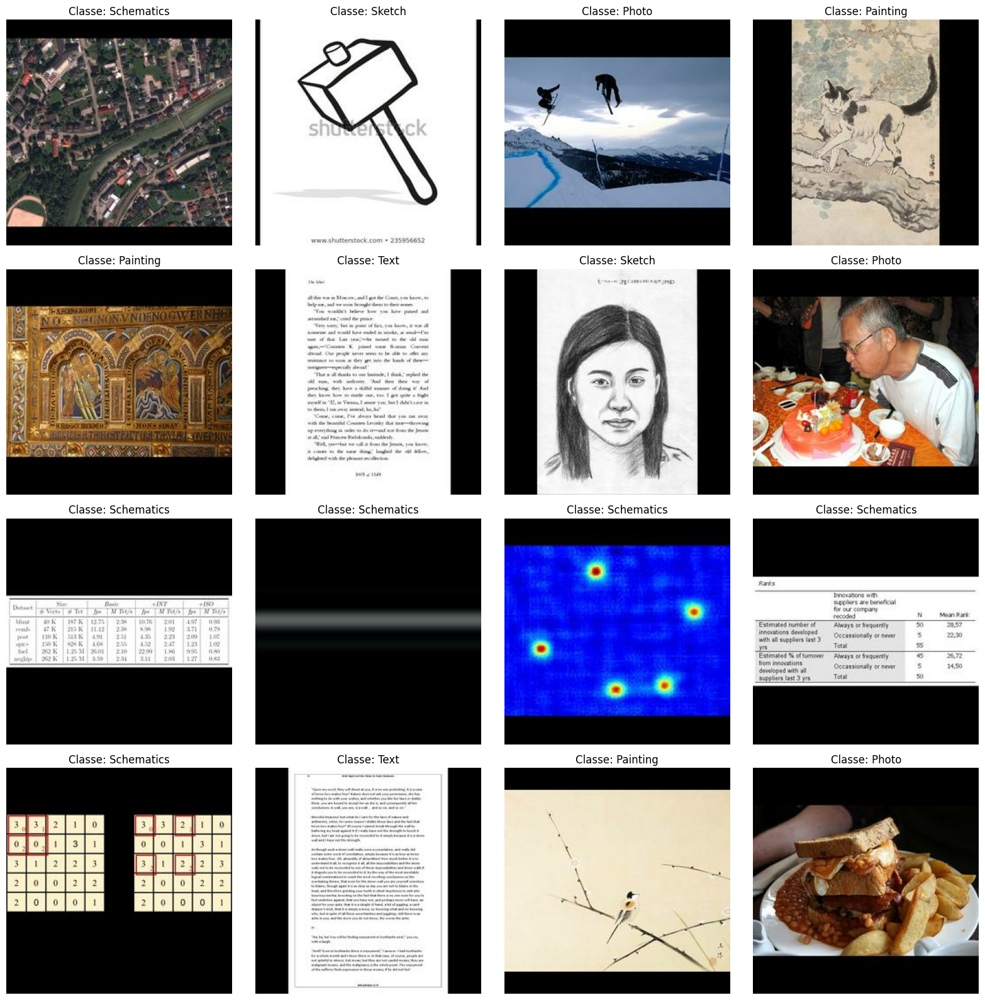

In [4]:
# Vérification des classes détectées
class_names = train_ds.class_names
print("Classes détectées:", class_names)

# Affichage de quelques images
plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
    for i in range(16):
        plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Classe: {class_names[labels[i]]}")
        plt.axis("off")
plt.tight_layout()
plt.show()

In [5]:
# Définition du modèle CNN
model = keras.Sequential([
    layers.Rescaling(1./255, input_shape=(img_size, img_size, 3)), 
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.25),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.25),
    layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.25),

    layers.GlobalAveragePooling2D(),  # Remplace Flatten() # layers.Flatten(),  # Transforme en vecteur 1D
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(len(class_names), activation='softmax')  
])

EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Compilation du modèle
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Afficher l'architecture corrigée
model.summary()

/home/quent/myenv/lib/python3.12/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 306,469 (1.17 MB)

 Trainable params: 305,317 (1.16 MB)

 Non-trainable params: 1,152 (4.50 KB)

In [6]:
# Entraînement
epochs=30

history = model.fit( train_ds, validation_data=val_ds, epochs=epochs, callbacks=[
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss', mode='min')
])

Epoch 1/30


I0000 00:00:1743760298.337948   17941 service.cc:152] XLA service 0x7f2e74001fb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1743760298.337998   17941 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 Laptop GPU, Compute Capability 8.9
2025-04-04 11:51:38.534659: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1743760299.069862   17941 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-04-04 11:51:50.569915: E external/local_xla/xla/service/slow_operation_alarm.cc:73] Trying algorithm eng57{k2=5,k13=1,k14=2,k18=1,k23=0} for conv %cudnn-conv-bw-filter.7 = (f32[32,32,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,32,256,256]{3,2,1,0} %bitcast.18000, f32[32,32,256,256]{3,2,1,0} %bitcast.18054), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", 

1205/1205 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.6916 - loss: 0.8356

1205/1205 ━━━━━━━━━━━━━━━━━━━━ 185s 136ms/step - accuracy: 0.6916 - loss: 0.8354 - val_accuracy: 0.7199 - val_loss: 0.8386
Epoch 2/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - accuracy: 0.8251 - loss: 0.4593

1205/1205 ━━━━━━━━━━━━━━━━━━━━ 145s 120ms/step - accuracy: 0.8251 - loss: 0.4593 - val_accuracy: 0.7406 - val_loss: 0.6111
Epoch 3/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - accuracy: 0.8555 - loss: 0.3818

1205/1205 ━━━━━━━━━━━━━━━━━━━━ 145s 120ms/step - accuracy: 0.8555 - loss: 0.3818 - val_accuracy: 0.8439 - val_loss: 0.4289
Epoch 4/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 149s 124ms/step - accuracy: 0.8750 - loss: 0.3455 - val_accuracy: 0.5945 - val_loss: 1.2088
Epoch 5/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.8836 - loss: 0.3206

1205/1205 ━━━━━━━━━━━━━━━━━━━━ 143s 119ms/step - accuracy: 0.8836 - loss: 0.3206 - val_accuracy: 0.9016 - val_loss: 0.2816
Epoch 6/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 143s 119ms/step - accuracy: 0.8941 - loss: 0.2885 - val_accuracy: 0.8529 - val_loss: 0.4069
Epoch 7/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 144s 119ms/step - accuracy: 0.9053 - loss: 0.2660 - val_accuracy: 0.8905 - val_loss: 0.2990
Epoch 8/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 145s 120ms/step - accuracy: 0.9099 - loss: 0.2524 - val_accuracy: 0.8842 - val_loss: 0.3606
Epoch 9/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.9135 - loss: 0.2415

1205/1205 ━━━━━━━━━━━━━━━━━━━━ 143s 118ms/step - accuracy: 0.9135 - loss: 0.2415 - val_accuracy: 0.9106 - val_loss: 0.2642
Epoch 10/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 142s 118ms/step - accuracy: 0.9200 - loss: 0.2221 - val_accuracy: 0.8290 - val_loss: 0.4036
Epoch 11/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 145s 120ms/step - accuracy: 0.9218 - loss: 0.2104 - val_accuracy: 0.8824 - val_loss: 0.3536
Epoch 12/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 144s 119ms/step - accuracy: 0.9300 - loss: 0.2000 - val_accuracy: 0.8933 - val_loss: 0.3253
Epoch 13/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 145s 120ms/step - accuracy: 0.9331 - loss: 0.1920 - val_accuracy: 0.8151 - val_loss: 0.5750
Epoch 14/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - accuracy: 0.9337 - loss: 0.1857

1205/1205 ━━━━━━━━━━━━━━━━━━━━ 150s 125ms/step - accuracy: 0.9337 - loss: 0.1857 - val_accuracy: 0.9252 - val_loss: 0.2229
Epoch 15/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 152s 126ms/step - accuracy: 0.9343 - loss: 0.1784 - val_accuracy: 0.7331 - val_loss: 1.3428
Epoch 16/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 150s 125ms/step - accuracy: 0.9389 - loss: 0.1731 - val_accuracy: 0.9251 - val_loss: 0.2435
Epoch 17/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 151s 126ms/step - accuracy: 0.9430 - loss: 0.1602 - val_accuracy: 0.9117 - val_loss: 0.2559
Epoch 18/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 154s 128ms/step - accuracy: 0.9439 - loss: 0.1583 - val_accuracy: 0.7236 - val_loss: 3.2480
Epoch 19/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9442 - loss: 0.1523

1205/1205 ━━━━━━━━━━━━━━━━━━━━ 209s 174ms/step - accuracy: 0.9442 - loss: 0.1523 - val_accuracy: 0.9357 - val_loss: 0.2146
Epoch 20/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.9494 - loss: 0.1467

1205/1205 ━━━━━━━━━━━━━━━━━━━━ 207s 172ms/step - accuracy: 0.9494 - loss: 0.1467 - val_accuracy: 0.9454 - val_loss: 0.1634
Epoch 21/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 209s 173ms/step - accuracy: 0.9491 - loss: 0.1456 - val_accuracy: 0.9395 - val_loss: 0.1922
Epoch 22/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 206s 171ms/step - accuracy: 0.9521 - loss: 0.1361 - val_accuracy: 0.9359 - val_loss: 0.2102
Epoch 23/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 207s 171ms/step - accuracy: 0.9539 - loss: 0.1277 - val_accuracy: 0.9245 - val_loss: 0.2339
Epoch 24/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 208s 172ms/step - accuracy: 0.9530 - loss: 0.1332 - val_accuracy: 0.9282 - val_loss: 0.2588
Epoch 25/30
1205/1205 ━━━━━━━━━━━━━━━━━━━━ 208s 172ms/step - accuracy: 0.9562 - loss: 0.1242 - val_accuracy: 0.9443 - val_loss: 0.1799


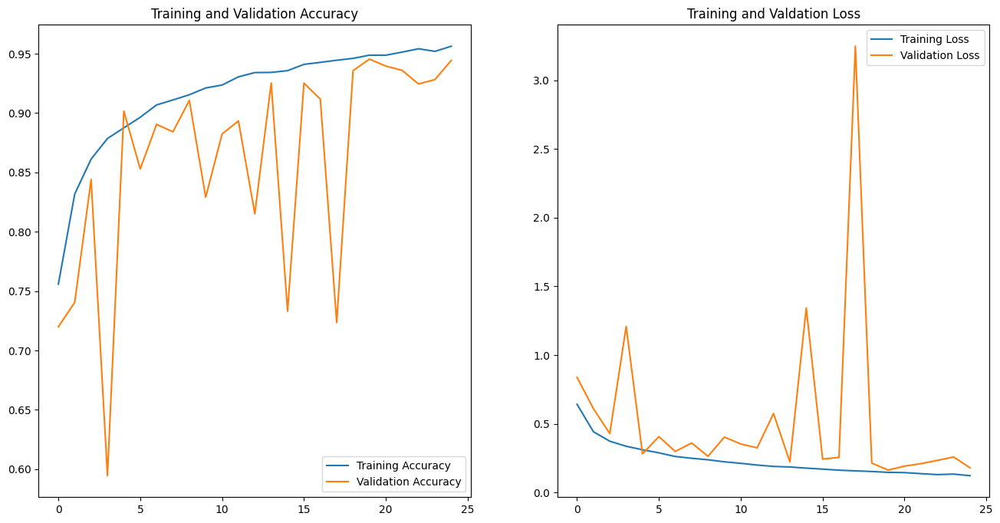

In [8]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Valdation Loss')
plt.show()

In [9]:
# Sauvegarde du modèle
model.save('Data Science/Projet/model.weights.h5')

In [26]:
dataset_path = "/mnt/c/Users/quent/Documents/Devoir/CESI/Deep learning/OneDrive_2025-03-26/Data Science/Datasets/Test from internet"
batch_size = 32     # Taille standard pour GPU
img_size = 256

full_ds2 = keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    image_size=img_size,
    batch_size=batch_size
)

Found 18 files belonging to 5 classes.


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


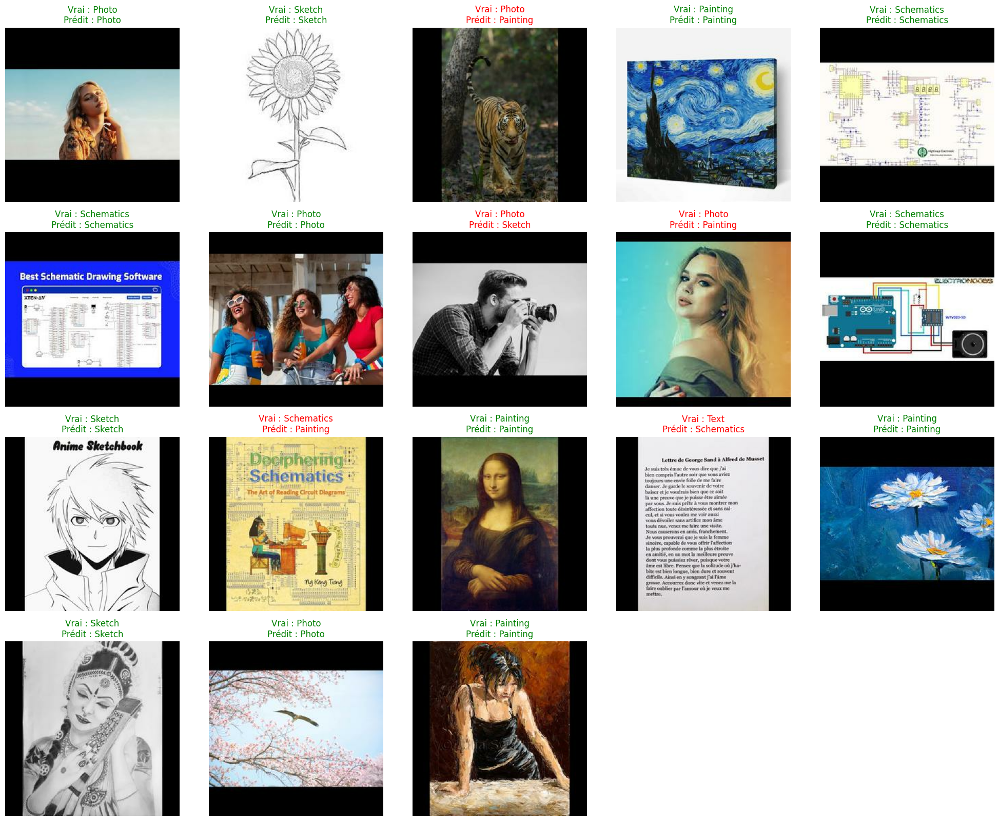

In [27]:
# Charger jusqu'à 50 images, peu importe la taille des batches
target_count = 18
collected_images = []
collected_labels = []

for batch in full_ds2:
    images, labels = batch
    collected_images.append(images)
    collected_labels.append(labels)
    
    if sum([img.shape[0] for img in collected_images]) >= target_count:
        break

# Concaténer tous les batches
images = tf.concat([tf.cast(img, tf.float32) for img in collected_images], axis=0)[:target_count]
labels = tf.concat([tf.cast(lbl, tf.int32) for lbl in collected_labels], axis=0)[:target_count]


# Charger le modèle
model = keras.models.load_model('Data Science/Projet/model.weights.h5')
class_names = train_ds.class_names

# Prédictions
predictions = model.predict(images)
predicted_classes = tf.argmax(predictions, axis=1)

# Affichage
plt.figure(figsize=(20, 40))  # 10 lignes x 5 colonnes
for i in range(target_count):
    plt.subplot(10, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    
    # Déterminer la couleur du texte
    if class_names[predicted_classes[i]] == class_names[labels[i]]:
        color = 'green'  # Correct
    else:
        color = 'red'  # Incorrect
    
    # Affichage du texte avec taille et couleur conditionnelle
    plt.title(f"Vrai : {class_names[labels[i]]}\nPrédit : {class_names[predicted_classes[i]]}", fontsize=12, color=color)
    plt.axis("off")

plt.tight_layout()
plt.show()


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


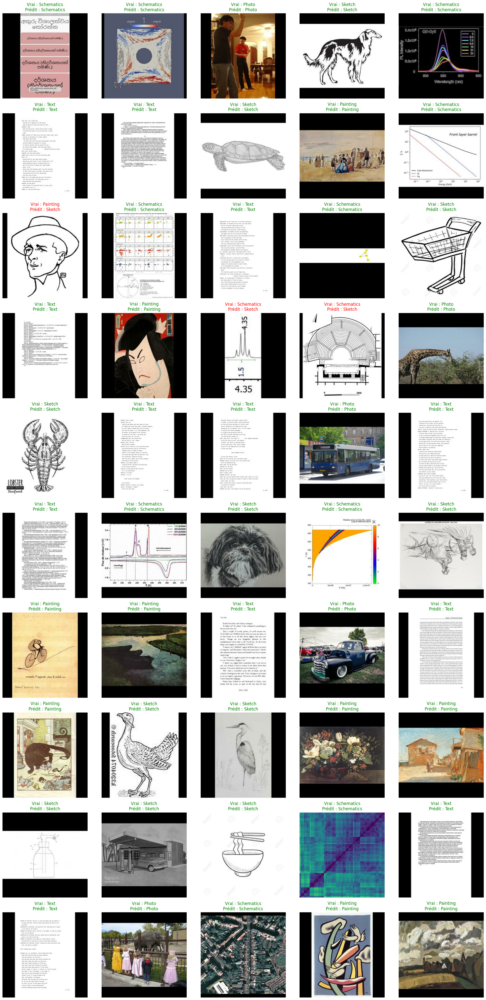

In [21]:
# Charger jusqu'à 50 images, peu importe la taille des batches
target_count = 50
collected_images = []
collected_labels = []

for batch in test_ds:
    images, labels = batch
    collected_images.append(images)
    collected_labels.append(labels)
    
    if sum([img.shape[0] for img in collected_images]) >= target_count:
        break

# Concaténer tous les batches
images = tf.concat([tf.cast(img, tf.float32) for img in collected_images], axis=0)[:target_count]
labels = tf.concat([tf.cast(lbl, tf.int32) for lbl in collected_labels], axis=0)[:target_count]


# Charger le modèle
model = keras.models.load_model('Data Science/Projet/model.weights.h5')
class_names = train_ds.class_names

# Prédictions
predictions = model.predict(images)
predicted_classes = tf.argmax(predictions, axis=1)

# Affichage
plt.figure(figsize=(20, 40))  # 10 lignes x 5 colonnes
for i in range(target_count):
    plt.subplot(10, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    
    # Déterminer la couleur du texte
    if class_names[predicted_classes[i]] == class_names[labels[i]]:
        color = 'green'  # Correct
    else:
        color = 'red'  # Incorrect
    
    # Affichage du texte avec taille et couleur conditionnelle
    plt.title(f"Vrai : {class_names[labels[i]]}\nPrédit : {class_names[predicted_classes[i]]}", fontsize=12, color=color)
    plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


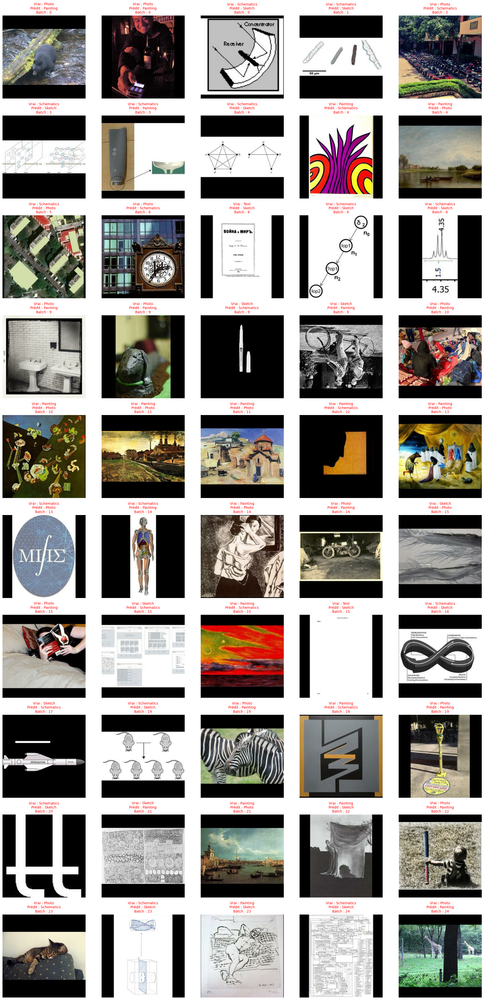

In [20]:
# Charger jusqu'à 50 images mal prédites, peu importe la taille des batches
target_count = 50
collected_images = []
collected_labels = []
misclassified_images = []  # Liste pour stocker les images mal prédites
misclassified_labels = []  # Liste pour stocker les vraies étiquettes des images mal prédites
misclassified_preds = []  # Liste pour stocker les prédictions des images mal prédites
misclassified_batch_index = []  # Liste pour stocker les indices de batch des mauvaises prédictions

# Parcours de tous les batches pour collecter des mauvaises prédictions
for batch_index, batch in enumerate(test_ds):
    images, labels = batch
    # Prédictions
    predictions = model.predict(images)
    predicted_classes = tf.argmax(predictions, axis=1)
    
    # Vérifier les mauvaises prédictions
    for i in range(images.shape[0]):
        if tf.not_equal(tf.cast(predicted_classes[i], tf.int32), tf.cast(labels[i], tf.int32)):  # Comparaison correcte
            misclassified_images.append(images[i])
            misclassified_labels.append(labels[i])
            misclassified_preds.append(predicted_classes[i])
            misclassified_batch_index.append(batch_index)

    # Arrêter lorsque nous avons collecté target_count mauvaises prédictions
    if len(misclassified_images) >= target_count:
        break

# Limiter à 50 premières images mal prédites
misclassified_images = misclassified_images[:target_count]
misclassified_labels = misclassified_labels[:target_count]
misclassified_preds = misclassified_preds[:target_count]
misclassified_batch_index = misclassified_batch_index[:target_count]

# Affichage des mauvaises prédictions
plt.figure(figsize=(20, 40))  # 10 lignes x 5 colonnes
for i in range(len(misclassified_images)):
    plt.subplot(10, 5, i + 1)
    plt.imshow(misclassified_images[i].numpy().astype("uint8"))
    
    # Déterminer la couleur du texte
    color = 'red'  # Comme c'est une mauvaise prédiction, on garde le rouge
    
    # Affichage du texte avec taille et couleur conditionnelle
    plt.title(f"Vrai : {class_names[misclassified_labels[i]]}\nPrédit : {class_names[misclassified_preds[i]]}\nBatch : {misclassified_batch_index[i]}", fontsize=10, color=color)
    plt.axis("off")

plt.tight_layout()
plt.show()


81/81 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step


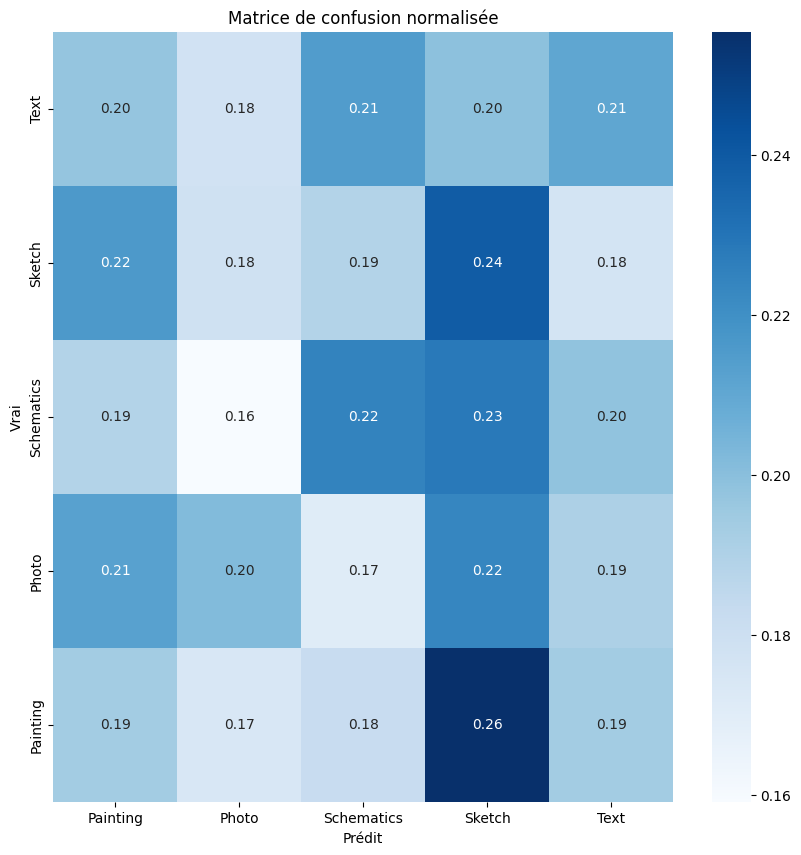

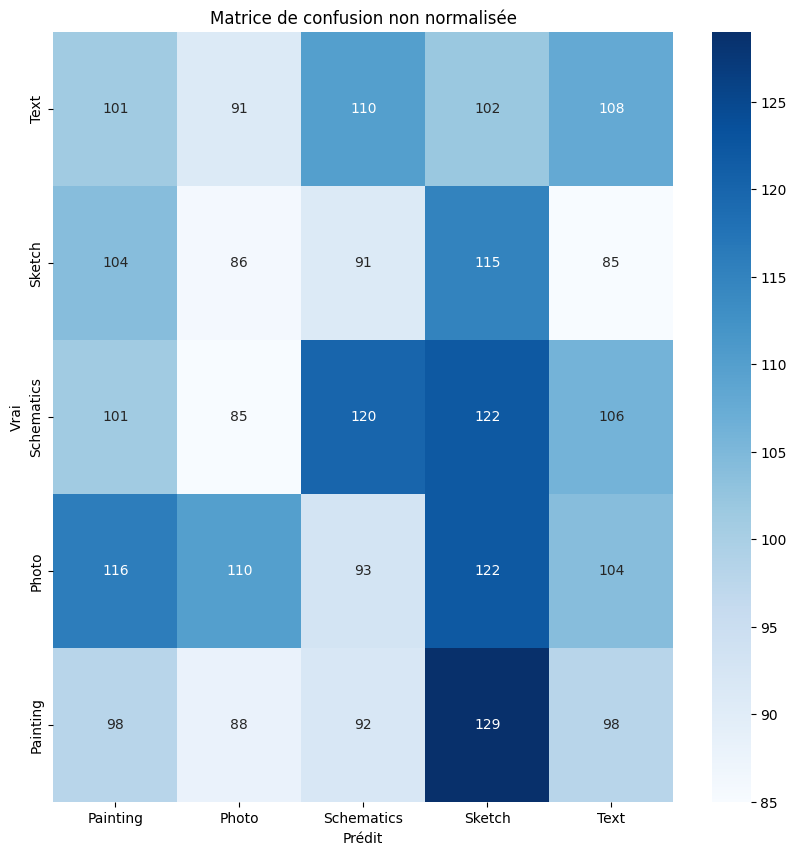

Rapport de classification :
               precision    recall  f1-score   support

    Painting       0.19      0.20      0.20       512
       Photo       0.19      0.18      0.18       481
  Schematics       0.24      0.22      0.23       534
      Sketch       0.21      0.22      0.21       545
        Text       0.20      0.19      0.19       505

    accuracy                           0.20      2577
   macro avg       0.20      0.20      0.20      2577
weighted avg       0.20      0.20      0.20      2577

Précision globale : 0.2045
Support (nombre d'exemples par classe) :
Painting: 512
Photo: 481
Schematics: 534
Sketch: 545
Text: 505


In [14]:
import numpy as np
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, accuracy_score

# Récupération des prédictions et des vraies étiquettes
predictions = model.predict(test_ds)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.concatenate([y.numpy() for _, y in test_ds], axis=0)

# Création de la matrice de confusion
confusion_matrix = tf.math.confusion_matrix(true_classes, predicted_classes, num_classes=len(class_names))
confusion_matrix = confusion_matrix.numpy()

# Normalisation de la matrice de confusion
confusion_matrix_normalized = confusion_matrix.astype('float') / confusion_matrix.sum(axis=1)[:, np.newaxis]

# Inverser l'ordre des labels uniquement pour l'affichage
inverted_class_names = class_names[::-1]

# Affichage de la matrice de confusion normalisée
plt.figure(figsize=(10, 10))
sns.heatmap(confusion_matrix_normalized, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=class_names, yticklabels=inverted_class_names)
plt.xlabel('Prédit')
plt.ylabel('Vrai')
plt.title('Matrice de confusion normalisée')
plt.show()

# Affichage de la matrice de confusion non normalisée
plt.figure(figsize=(10, 10))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=inverted_class_names)
plt.xlabel('Prédit')
plt.ylabel('Vrai')
plt.title('Matrice de confusion non normalisée')
plt.show()

# Calcul du rapport de classification avec des statistiques intéressantes
report = classification_report(true_classes, predicted_classes, target_names=class_names)
print("Rapport de classification :\n", report)

# Calcul de la précision globale (accuracy)
accuracy = accuracy_score(true_classes, predicted_classes)
print(f"Précision globale : {accuracy:.4f}")

# Support (nombre d'exemples par classe)
support = np.bincount(true_classes)
print("Support (nombre d'exemples par classe) :")
for i, class_name in enumerate(class_names):
    print(f"{class_name}: {support[i]}")
